# Sentinel-2 Temporal Analysis\n\nTemporal evolution of **RGB composites** and **NDVI** for parcel

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

In [10]:
ZARR_PATH = "../agrixel-fair-dockerV2/data/output/files/SENTINEL-2/L62196,L62198/cube.zarr"
ds = xr.open_zarr(ZARR_PATH, consolidated=False)
ds["variable"] = ds["variable"].astype("str")
print(ds)
print(f"\nDates: {ds.time.values}")
print(f"Variables: {ds.variable.values}")

<xarray.Dataset> Size: 10MB
Dimensions:   (time: 11, variable: 7, y: 184, x: 181)
Coordinates:
  * time      (time) datetime64[ns] 88B 2021-02-19T10:49:59 ... 2021-09-17T10...
  * variable  (variable) <U4 112B 'B02' 'B03' 'B04' 'B08' 'B11' 'B12' 'NDVI'
  * y         (y) float64 1kB 5.033e+06 5.033e+06 ... 5.031e+06 5.031e+06
  * x         (x) float64 1kB 3.271e+04 3.272e+04 ... 3.45e+04 3.451e+04
Data variables:
    data      (time, variable, y, x) float32 10MB ...
Attributes:
    crs:        EPSG:3857
    res_m:      10.0
    height:     184
    width:      181
    transform:  [10.0, 0.0, 32702.5642426715, 0.0, -10.0, 5032695.364617159]
    variables:  ['B02', 'B03', 'B04', 'B08', 'B11', 'B12', 'NDVI']
    time_iso:   ['2021-02-19T10:49:59Z', '2021-03-31T10:46:19Z', '2021-04-05T...

Dates: ['2021-02-19T10:49:59.000000000' '2021-03-31T10:46:19.000000000'
 '2021-04-05T10:50:21.000000000' '2021-05-05T10:50:31.000000000'
 '2021-05-20T10:46:19.000000000' '2021-06-14T10:50:31.000000000'
 '2

## RGB Composite — Temporal Evolution - True-color composites using B04 (Red), B03 (Green), B02 (Blue) with percentile stretching.

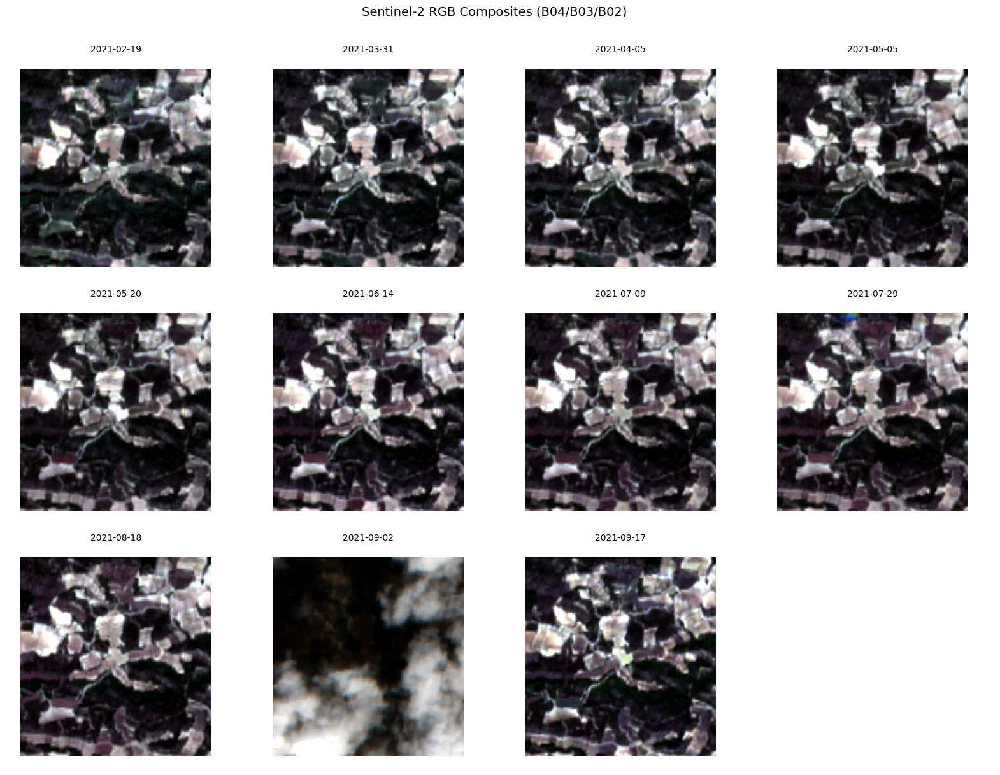

In [17]:
n_times = ds.sizes["time"]
ncols = 4
nrows = int(np.ceil(n_times / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4 * nrows))
axes = axes.flatten()

for i in range(n_times):
    r = ds["data"].sel(variable="B04").isel(time=i).values.astype(float)
    g = ds["data"].sel(variable="B03").isel(time=i).values.astype(float)
    b = ds["data"].sel(variable="B02").isel(time=i).values.astype(float)

    rgb = np.stack([r, g, b], axis=-1)

    # Percentile stretch per band
    for ch in range(3):
        band = rgb[:, :, ch]
        valid = band[band > 0]
        if valid.size > 0:
            p2, p98 = np.percentile(valid, [2, 98])
            rgb[:, :, ch] = np.clip((band - p2) / (p98 - p2 + 1e-10), 0, 1)

    date_str = str(ds.time.values[i])[:10]
    axes[i].imshow(rgb, origin="upper")
    axes[i].set_title(date_str, fontsize=10)
    axes[i].axis("off")

# Hide unused subplots
for j in range(n_times, len(axes)):
    axes[j].axis("off")

fig.suptitle("Sentinel-2 RGB Composites (B04/B03/B02)", fontsize=14, y=1.01)
plt.tight_layout()
plt.show()

## NDVI — Temporal Evolution\n\nNormalized Difference Vegetation Index maps per acquisition date.

/var/folders/px/2blwyyr1699bm6tby6n9xf440000gn/T/ipykernel_77693/3402462722.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


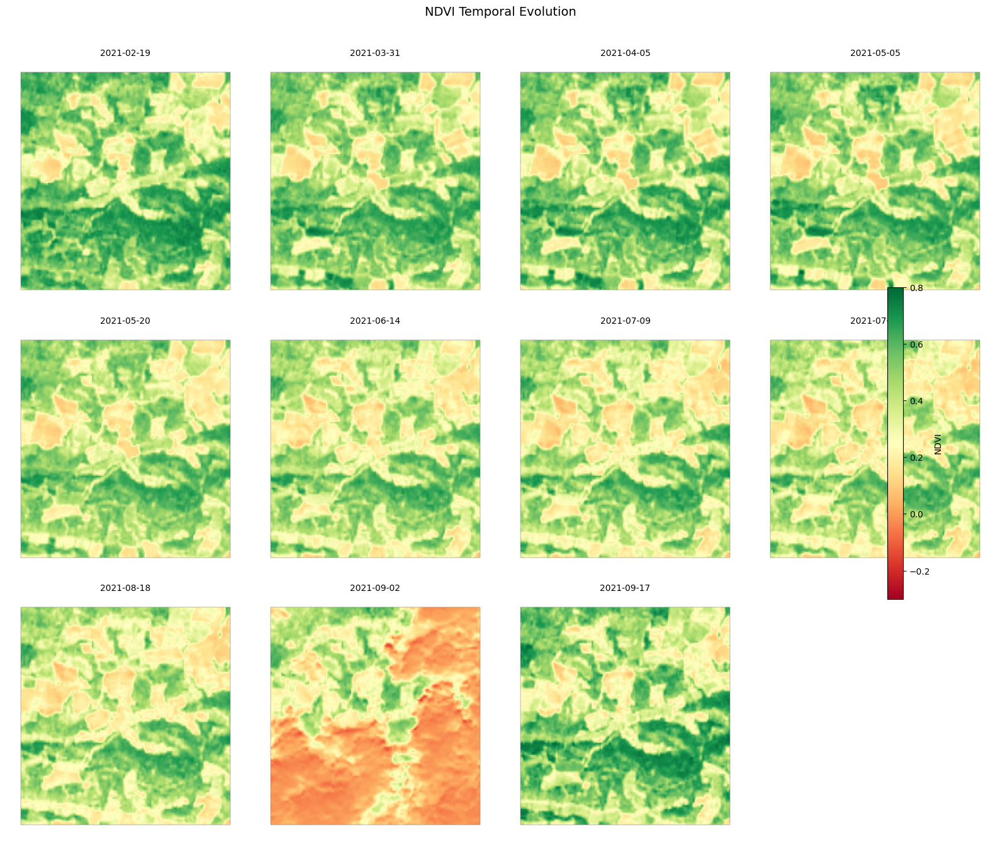

In [12]:
fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4.5 * nrows))
axes = axes.flatten()

for i in range(n_times):
    ndvi = ds["data"].sel(variable="NDVI").isel(time=i).values
    date_str = str(ds.time.values[i])[:10]

    im = axes[i].imshow(ndvi, cmap="RdYlGn", vmin=-0.3, vmax=0.8, origin="upper")
    axes[i].set_title(date_str, fontsize=10)
    axes[i].axis("off")

for j in range(n_times, len(axes)):
    axes[j].axis("off")

fig.suptitle("NDVI Temporal Evolution", fontsize=14, y=1.01)
fig.colorbar(im, ax=axes, label="NDVI", fraction=0.02, pad=0.04, shrink=0.6)
plt.tight_layout()
plt.show()

## EVI — Temporal Evolution\n\nEnhanced Vegetation Index corrects for soil background and atmospheric influences using the blue band:\n\n`EVI = 2.5 × (B08 − B04) / (B08 + 6×B04 − 7.5×B02 + 1)`

/var/folders/px/2blwyyr1699bm6tby6n9xf440000gn/T/ipykernel_77693/2040594442.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


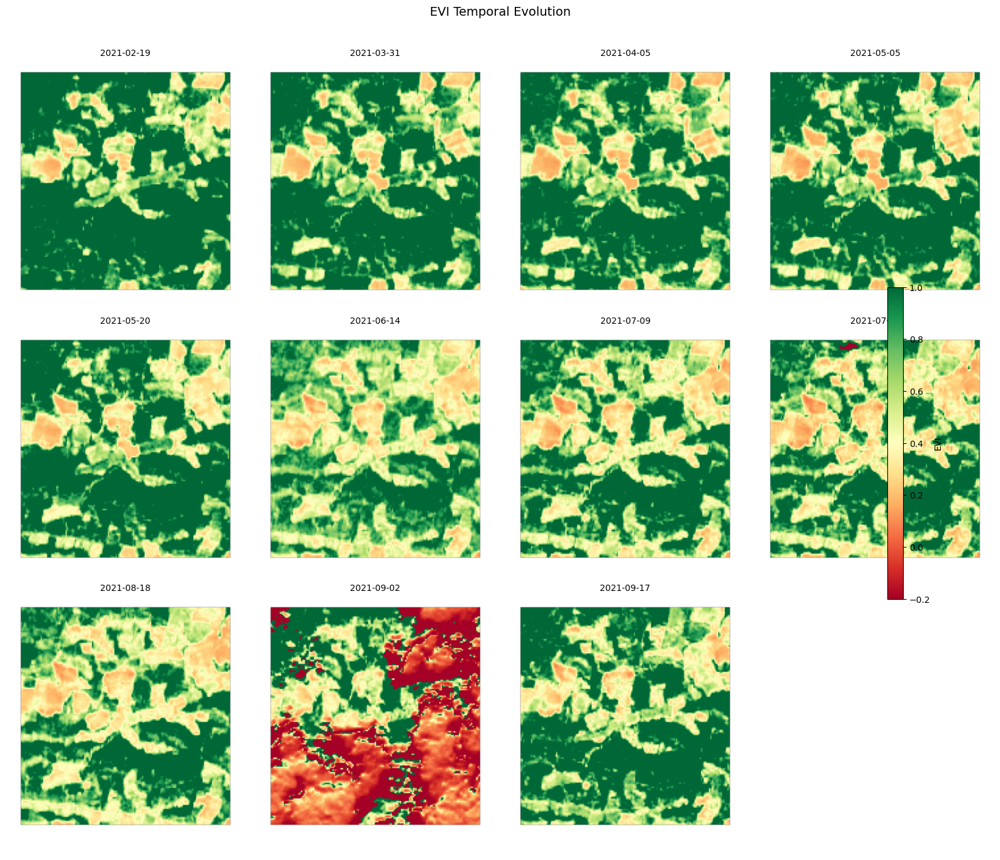

In [13]:
fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4.5 * nrows))
axes = axes.flatten()

for i in range(n_times):
    b02 = ds["data"].sel(variable="B02").isel(time=i).values.astype(float)
    b04 = ds["data"].sel(variable="B04").isel(time=i).values.astype(float)
    b08 = ds["data"].sel(variable="B08").isel(time=i).values.astype(float)

    denom = b08 + 6.0 * b04 - 7.5 * b02 + 1.0
    evi = np.where(denom != 0, 2.5 * (b08 - b04) / denom, 0.0)

    date_str = str(ds.time.values[i])[:10]
    im = axes[i].imshow(evi, cmap="RdYlGn", vmin=-0.2, vmax=1, origin="upper")
    axes[i].set_title(date_str, fontsize=10)
    axes[i].axis("off")

for j in range(n_times, len(axes)):
    axes[j].axis("off")

fig.suptitle("EVI Temporal Evolution", fontsize=14, y=1.01)
fig.colorbar(im, ax=axes, label="EVI", fraction=0.02, pad=0.04, shrink=0.6)
plt.tight_layout()
plt.show()

## Mean NDVI Time Series\n\nSpatially-averaged NDVI over the parcel across all acquisition dates.

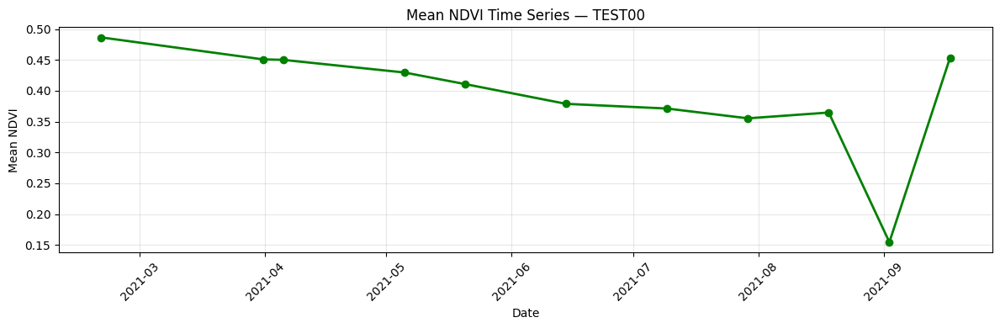

In [18]:
ndvi_all = ds["data"].sel(variable="NDVI")

# Mask nodata (zeros / NaNs) before computing mean
ndvi_masked = ndvi_all.where(ndvi_all != 0)
mean_ndvi = ndvi_masked.mean(dim=["x", "y"]).values
dates = ds.time.values

fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(dates, mean_ndvi, "o-", color="green", linewidth=2, markersize=6)
ax.set_xlabel("Date")
ax.set_ylabel("Mean NDVI")
ax.set_title("Mean NDVI Time Series — TEST00")
ax.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## Animated GIF — RGB + NDVI Evolution\n\nSide-by-side RGB composite and NDVI map per date, exported as an animated GIF.

GIF saved to ../data/sentinel2_temporal_evolution.gif


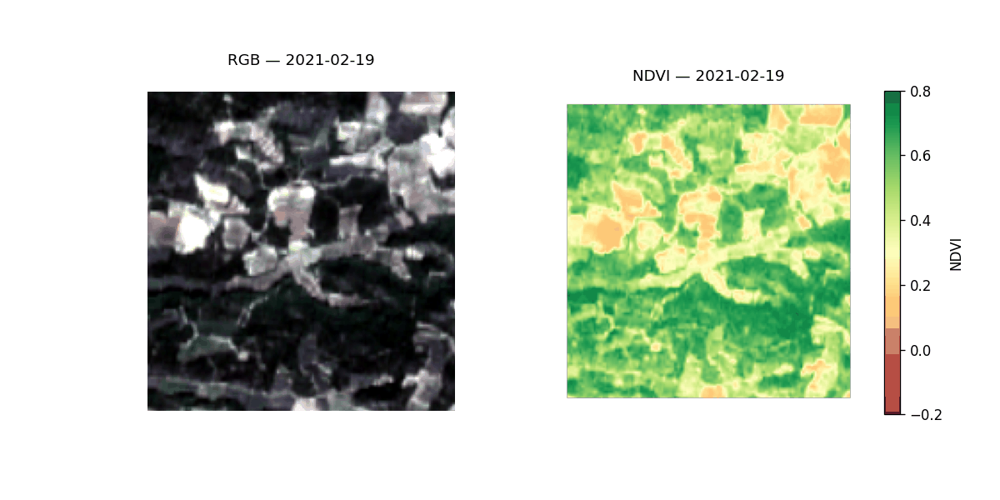

In [19]:
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image, display

GIF_PATH = "../data/sentinel2_temporal_evolution.gif"

fig, (ax_rgb, ax_ndvi) = plt.subplots(1, 2, figsize=(10, 5))
plt.close(fig)  # prevent static display

# Precompute all frames
rgb_frames = []
ndvi_frames = []
for i in range(n_times):
    r = ds["data"].sel(variable="B04").isel(time=i).values.astype(float)
    g = ds["data"].sel(variable="B03").isel(time=i).values.astype(float)
    b = ds["data"].sel(variable="B02").isel(time=i).values.astype(float)
    rgb = np.stack([r, g, b], axis=-1)
    for ch in range(3):
        band = rgb[:, :, ch]
        valid = band[band > 0]
        if valid.size > 0:
            p2, p98 = np.percentile(valid, [2, 98])
            rgb[:, :, ch] = np.clip((band - p2) / (p98 - p2 + 1e-10), 0, 1)
    rgb_frames.append(rgb)
    ndvi_frames.append(ds["data"].sel(variable="NDVI").isel(time=i).values)

# Initialize artists
im_rgb = ax_rgb.imshow(rgb_frames[0], origin="upper")
im_ndvi = ax_ndvi.imshow(ndvi_frames[0], cmap="RdYlGn", vmin=-0.2, vmax=0.8, origin="upper")
fig.colorbar(im_ndvi, ax=ax_ndvi, label="NDVI", fraction=0.046, pad=0.04)
ax_rgb.axis("off")
ax_ndvi.axis("off")
title = fig.suptitle("", fontsize=13)

def update(i):
    im_rgb.set_data(rgb_frames[i])
    im_ndvi.set_data(ndvi_frames[i])
    date_str = str(ds.time.values[i])[:10]
    ax_rgb.set_title(f"RGB — {date_str}", fontsize=11)
    ax_ndvi.set_title(f"NDVI — {date_str}", fontsize=11)
    return im_rgb, im_ndvi

anim = FuncAnimation(fig, update, frames=n_times, interval=800, blit=True)
anim.save(GIF_PATH, writer=PillowWriter(fps=1.5), dpi=120)
print(f"GIF saved to {GIF_PATH}")
display(Image(filename=GIF_PATH))

## Agriculture Growth Stage Composite
https://custom-scripts.sentinel-hub.com/sentinel-2/agriculture_growth_stage/


/var/folders/px/2blwyyr1699bm6tby6n9xf440000gn/T/ipykernel_77693/1097086035.py:23: RuntimeWarning: Mean of empty slice
  period_mean = np.nanmean(ndvi_all[s], axis=0)
/var/folders/px/2blwyyr1699bm6tby6n9xf440000gn/T/ipykernel_77693/1097086035.py:45: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


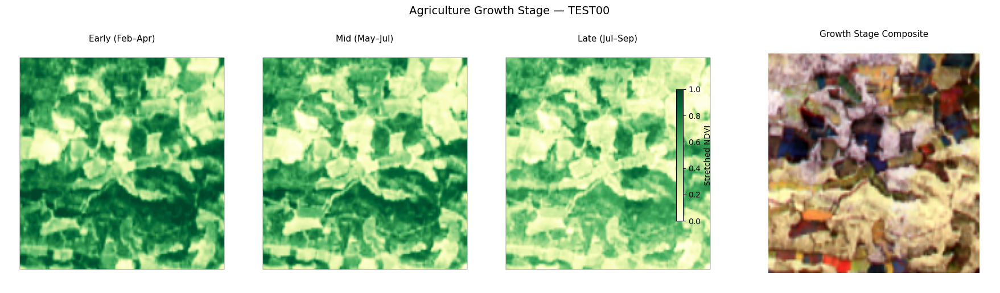

Periods: Early (Feb–Apr) | Mid (May–Jul) | Late (Jul–Sep)
Images per period: 3, 4, 4


In [20]:
import pandas as pd

# Split acquisitions into 3 equal-sized periods
times = pd.DatetimeIndex(ds.time.values)
n = len(times)
split1, split2 = n // 3, 2 * n // 3

period_slices = [
    slice(0, split1),        # early
    slice(split1, split2),   # mid
    slice(split2, n),        # late
]
period_labels = [
    f"Early ({times[0]:%b}–{times[split1-1]:%b})",
    f"Mid ({times[split1]:%b}–{times[split2-1]:%b})",
    f"Late ({times[split2]:%b}–{times[-1]:%b})",
]

# Compute mean NDVI per period, stretched [0.1, 0.7] → [0, 1]
ndvi_all = ds["data"].sel(variable="NDVI").values  # (time, y, x)
channels = []
for s in period_slices:
    period_mean = np.nanmean(ndvi_all[s], axis=0)
    stretched = np.clip((period_mean - 0.1) / (0.7 - 0.1), 0, 1)
    channels.append(stretched)

growth_rgb = np.stack(channels, axis=-1)  # R=early, G=mid, B=late

# Plot
fig, axes = plt.subplots(1, 4, figsize=(18, 5), gridspec_kw={"width_ratios": [1, 1, 1, 1.2]})

# Individual period NDVI maps
for ax, ch, label in zip(axes[:3], channels, period_labels):
    im = ax.imshow(ch, cmap="YlGn", vmin=0, vmax=1, origin="upper")
    ax.set_title(label, fontsize=11)
    ax.axis("off")

# Growth stage composite
axes[3].imshow(growth_rgb, origin="upper")
axes[3].set_title("Growth Stage Composite", fontsize=11)
axes[3].axis("off")

fig.colorbar(im, ax=axes[:3], label="Stretched NDVI", fraction=0.02, pad=0.04, shrink=0.6)
fig.suptitle("Agriculture Growth Stage — TEST00", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

print(f"Periods: {' | '.join(period_labels)}")
print(f"Images per period: {split1}, {split2 - split1}, {n - split2}")